##### Problem Statement : 

    GOAL: The goal of this competition is to predict the price of used cars based on various attributes.
    
    Evaluation
    Root Mean Squared Error (RMSE)
    Submissions are scored on the root mean squared error. RMSE is defined as:

    RMSE = Root((yi - yˆi)^2/N)
    where 
        yˆi is the predicted value and 
        yi is the original value for each instance i.

##### Importing Necessary required Libraries.

In [212]:
# !pip install catboost

In [1]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt
import seaborn as sns, plotly.express as px
import regex as re
import math

import missingno as msno
import warnings
warnings.filterwarnings('ignore')

from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor


import tensorflow as tf
from tensorflow import keras

In [2]:
train_df = pd.read_csv('train.csv')
train_df.head()

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,0,MINI,Cooper S Base,2007,213000,Gasoline,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,A/T,Yellow,Gray,None reported,Yes,4200
1,1,Lincoln,LS V8,2002,143250,Gasoline,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,A/T,Silver,Beige,At least 1 accident or damage reported,Yes,4999
2,2,Chevrolet,Silverado 2500 LT,2002,136731,E85 Flex Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capab...,A/T,Blue,Gray,None reported,Yes,13900
3,3,Genesis,G90 5.0 Ultimate,2017,19500,Gasoline,420.0HP 5.0L 8 Cylinder Engine Gasoline Fuel,Transmission w/Dual Shift Mode,Black,Black,None reported,Yes,45000
4,4,Mercedes-Benz,Metris Base,2021,7388,Gasoline,208.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,7-Speed A/T,Black,Beige,None reported,Yes,97500


In [3]:
test_df = pd.read_csv('test.csv')
test_df.head()

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title
0,188533,Land,Rover LR2 Base,2015,98000,Gasoline,240.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,6-Speed A/T,White,Beige,None reported,Yes
1,188534,Land,Rover Defender SE,2020,9142,Hybrid,395.0HP 3.0L Straight 6 Cylinder Engine Gasoli...,8-Speed A/T,Silver,Black,None reported,Yes
2,188535,Ford,Expedition Limited,2022,28121,Gasoline,3.5L V6 24V PDI DOHC Twin Turbo,10-Speed Automatic,White,Ebony,None reported,NaN
3,188536,Audi,A6 2.0T Sport,2016,61258,Gasoline,2.0 Liter TFSI,Automatic,Silician Yellow,Black,None reported,NaN
4,188537,Audi,A6 2.0T Premium Plus,2018,59000,Gasoline,252.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,A/T,Gray,Black,None reported,Yes


<Axes: >

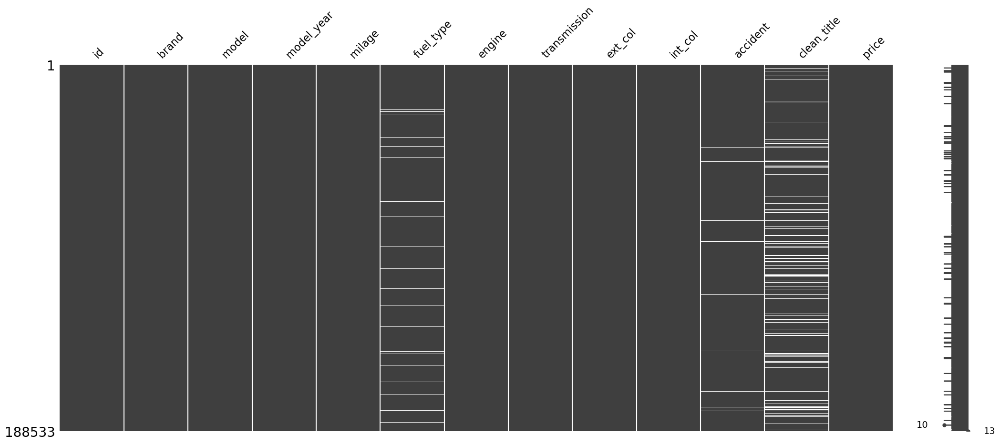

In [4]:
msno.matrix(train_df)

###### Lets understand the overall training data to Evalute it.

    Data Attributes:
        id           ::    A unique identifier for each car listing.
        brand        ::    The manufacturer or brand of the car (e.g., MINI, Lincoln, Chevrolet).
        model        ::    The specific model of the car (e.g., Cooper S Base, LS V8).
        model_year   ::    The year the car model was produced.
        mileage      ::    The total distance the car has been driven, usually measured in miles.
        fuel_type    ::    The type of fuel the car uses (e.g., Gasoline, E85 Flex Fuel).
        engine       ::    Specifications of the engine, including horsepower and engine size.
        transmission ::    The type of transmission (e.g., Automatic Transmission (A/T), 7-Speed A/T).
        ext_col      ::    The color of the car's exterior.
        int_col      ::    The color of the car's interior.
        accident     ::    Information about any reported accidents or damage.
        clean_title  ::    Indicates whether the car has a clean title or if there are any issues with its title status.
        price        ::    The asking price for the car.
       
    This type of data is valuable for evaluating car listings, determining market value, and understanding 
        vehicle conditions in the used car market.

In [5]:
print(f"The Shape of the train data in form of\n( Row - {train_df.shape[0]}, Column - {train_df.shape[1]})")
print(f"\nThe Shape of the test data in form of\n( Row - {test_df.shape[0]}, Column - {test_df.shape[1]})")

The Shape of the train data in form of
( Row - 188533, Column - 13)

The Shape of the test data in form of
( Row - 125690, Column - 12)


In [6]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188533 entries, 0 to 188532
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            188533 non-null  int64 
 1   brand         188533 non-null  object
 2   model         188533 non-null  object
 3   model_year    188533 non-null  int64 
 4   milage        188533 non-null  int64 
 5   fuel_type     183450 non-null  object
 6   engine        188533 non-null  object
 7   transmission  188533 non-null  object
 8   ext_col       188533 non-null  object
 9   int_col       188533 non-null  object
 10  accident      186081 non-null  object
 11  clean_title   167114 non-null  object
 12  price         188533 non-null  int64 
dtypes: int64(4), object(9)
memory usage: 18.7+ MB


In [7]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125690 entries, 0 to 125689
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            125690 non-null  int64 
 1   brand         125690 non-null  object
 2   model         125690 non-null  object
 3   model_year    125690 non-null  int64 
 4   milage        125690 non-null  int64 
 5   fuel_type     122307 non-null  object
 6   engine        125690 non-null  object
 7   transmission  125690 non-null  object
 8   ext_col       125690 non-null  object
 9   int_col       125690 non-null  object
 10  accident      124058 non-null  object
 11  clean_title   111451 non-null  object
dtypes: int64(3), object(9)
memory usage: 11.5+ MB


In [8]:
train_df.describe()

,id,model_year,milage,price
count,188533.000000,188533.000000,188533.000000,1.885330e+05
mean,94266.000000,2015.829998,65705.295174,4.387802e+04
std,54424.933488,5.660967,49798.158076,7.881952e+04
min,0.000000,1974.000000,100.000000,2.000000e+03
25%,47133.000000,2013.000000,24115.000000,1.700000e+04
50%,94266.000000,2017.000000,57785.000000,3.082500e+04
75%,141399.000000,2020.000000,95400.000000,4.990000e+04
max,188532.000000,2024.000000,405000.000000,2.954083e+06


In [9]:
train_df.describe().round(2).style.format(precision=2).background_gradient(cmap="Blues")

,id,model_year,milage,price
count,188533.00,188533.00,188533.00,188533.00
mean,94266.00,2015.83,65705.30,43878.02
std,54424.93,5.66,49798.16,78819.52
min,0.00,1974.00,100.00,2000.00
25%,47133.00,2013.00,24115.00,17000.00
50%,94266.00,2017.00,57785.00,30825.00
75%,141399.00,2020.00,95400.00,49900.00
max,188532.00,2024.00,405000.00,2954083.00


In [10]:
test_df.describe()

,id,model_year,milage
count,125690.000000,125690.000000,125690.000000
mean,251377.500000,2015.797526,66042.581510
std,36283.722005,5.673797,50223.858435
min,188533.000000,1974.000000,100.000000
25%,219955.250000,2013.000000,24500.000000
50%,251377.500000,2017.000000,57500.000000
75%,282799.750000,2020.000000,95798.000000
max,314222.000000,2024.000000,405000.000000


In [11]:
def summary(df):
    print(f'data shape: {df.shape}')
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#missing'] = df.isnull().sum().values 
    summ['%missing'] = df.isnull().sum().values / len(df)* 100
    summ['#unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    summ['first value'] = df.loc[0].values
    summ['second value'] = df.loc[1].values
    summ['third value'] = df.loc[2].values
    
    return summ

In [12]:
summary(train_df).style.background_gradient(cmap='plasma')

data shape: (188533, 13)


,data type,#missing,%missing,#unique,min,max,first value,second value,third value
id,int64,0,0.000000,188533,0.000000,188532.000000,0,1,2
brand,object,0,0.000000,57,nan,nan,MINI,Lincoln,Chevrolet
model,object,0,0.000000,1897,nan,nan,Cooper S Base,LS V8,Silverado 2500 LT
model_year,int64,0,0.000000,34,1974.000000,2024.000000,2007,2002,2002
milage,int64,0,0.000000,6651,100.000000,405000.000000,213000,143250,136731
fuel_type,object,5083,2.696080,7,nan,nan,Gasoline,Gasoline,E85 Flex Fuel
engine,object,0,0.000000,1117,nan,nan,172.0HP 1.6L 4 Cylinder Engine Gasoline Fuel,252.0HP 3.9L 8 Cylinder Engine Gasoline Fuel,320.0HP 5.3L 8 Cylinder Engine Flex Fuel Capability
transmission,object,0,0.000000,52,nan,nan,A/T,A/T,A/T
ext_col,object,0,0.000000,319,nan,nan,Yellow,Silver,Blue
int_col,object,0,0.000000,156,nan,nan,Gray,Beige,Gray


In [13]:
summary(test_df).style.background_gradient(cmap='plasma')

data shape: (125690, 12)


,data type,#missing,%missing,#unique,min,max,first value,second value,third value
id,int64,0,0.000000,125690,188533.000000,314222.000000,188533,188534,188535
brand,object,0,0.000000,55,nan,nan,Land,Land,Ford
model,object,0,0.000000,1891,nan,nan,Rover LR2 Base,Rover Defender SE,Expedition Limited
model_year,int64,0,0.000000,36,1974.000000,2024.000000,2015,2020,2022
milage,int64,0,0.000000,5700,100.000000,405000.000000,98000,9142,28121
fuel_type,object,3383,2.691543,7,nan,nan,Gasoline,Hybrid,Gasoline
engine,object,0,0.000000,1117,nan,nan,240.0HP 2.0L 4 Cylinder Engine Gasoline Fuel,395.0HP 3.0L Straight 6 Cylinder Engine Gasoline/Mild Electric Hybrid,3.5L V6 24V PDI DOHC Twin Turbo
transmission,object,0,0.000000,52,nan,nan,6-Speed A/T,8-Speed A/T,10-Speed Automatic
ext_col,object,0,0.000000,317,nan,nan,White,Silver,White
int_col,object,0,0.000000,156,nan,nan,Beige,Black,Ebony


In [14]:
(train_df == '–').sum()

id                 0
brand              0
model              0
model_year         0
milage             0
fuel_type        781
engine           925
transmission      87
ext_col          366
int_col         4527
accident           0
clean_title        0
price              0
dtype: int64

In [227]:
# train_df[train_df['int_col'] == '–'].head(30)

In [228]:
train_df.replace('–', np.nan, inplace = True)

In [229]:
(test_df == '–').sum()

id                 0
brand              0
model              0
model_year         0
milage             0
fuel_type        538
engine           617
transmission      40
ext_col          223
int_col         2953
accident           0
clean_title        0
dtype: int64

In [230]:
test_df.replace('–', np.nan, inplace = True)

In [231]:
train_df.columns

Index(['id', 'brand', 'model', 'model_year', 'milage', 'fuel_type', 'engine',
       'transmission', 'ext_col', 'int_col', 'accident', 'clean_title',
       'price'],
      dtype='object')

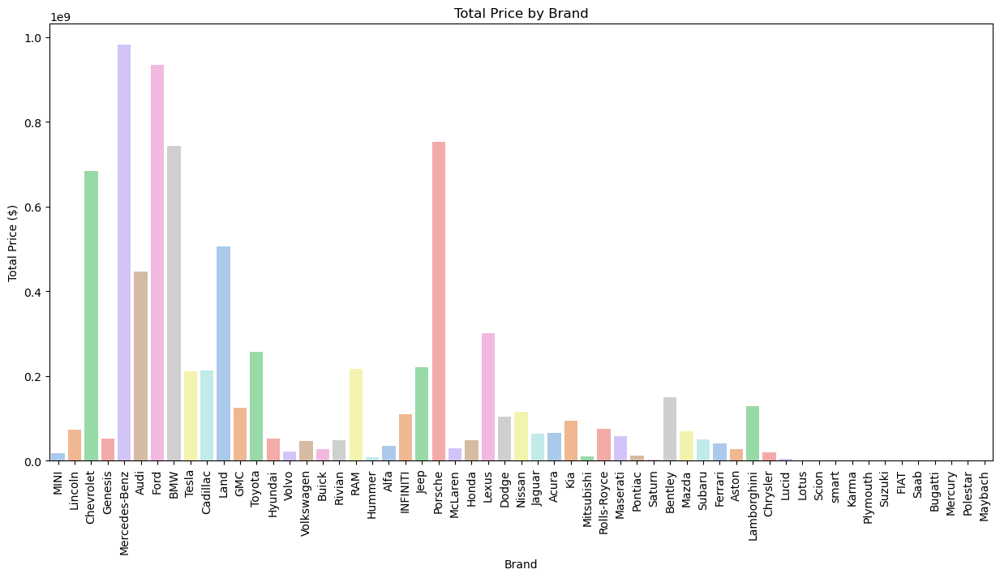

In [232]:
plt.figure(figsize = [15, 7])
sns.barplot(x = train_df['brand'], y = train_df['price'], palette='pastel', estimator = sum, errorbar = None)
plt.title('Total Price by Brand')
plt.ylabel('Total Price ($)')
plt.xlabel('Brand')
plt.xticks(rotation = 90)
plt.show()

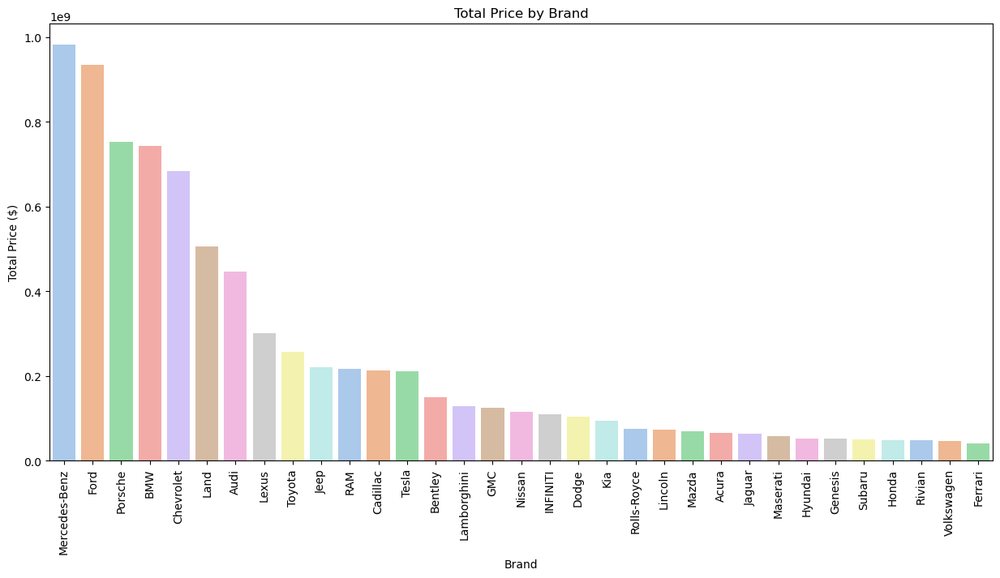

In [233]:
grp_one = train_df.pivot_table(
    values = 'price',
    index = 'brand',
    aggfunc = 'sum'
)

grp_one['price_percentage'] = (grp_one['price'] / grp_one['price'].sum()) * 100
grp_one.columns = ['total_price', 'price_percentage']
fov = grp_one[grp_one['price_percentage'] > 0.5]
order_value = fov.sort_values(by = 'total_price', ascending = False)
order_value

plt.figure(figsize = [15, 7])
sns.barplot(x = order_value.index, y = order_value['total_price'], palette = 'pastel')
plt.title('Total Price by Brand')
plt.ylabel('Total Price ($)')
plt.xlabel('Brand')
plt.xticks(rotation = 90)
plt.show()

In [234]:
grp_model_year = train_df.groupby('model_year')['price'].sum().reset_index()
grp_model_year.columns = ['model_year', 'total_price']
order_value = grp_model_year.sort_values(by='model_year')

fig = px.line(order_value, x = 'model_year', y = 'total_price', markers = True, title = 'Total Price by Model Year',
    labels={'total_price': 'Total Price ($)', 'model_year': 'Model Year'}
)

fig.show()

In [235]:
grp_one = train_df.pivot_table(
    values='price',
    index='model_year',
    columns='brand',
    aggfunc='sum',
)
total_prices = grp_one.sum()
top_brands = total_prices.nlargest(10).index
top_grp = grp_one[top_brands].reset_index()
top_grp_melted = top_grp.melt(id_vars='model_year', var_name='brand', value_name='total_price')

fig = px.line(top_grp_melted, x = 'model_year', y = 'total_price', color = 'brand',
    title='Total Price by Model Year for Top 10 Brands',
    labels={'total_price': 'Total Price ($)', 'model_year': 'Model Year'}
)
fig.show()

In [236]:
fig = px.scatter(
    train_df,
    x='milage',
    y='price',
    title='Scatter Plot of Mileage vs Price',
    labels={'mileage': 'Mileage', 'price': 'Price ($)'},
    opacity=0.7,
    color='brand',
    hover_data=['model_year']
)

fig.show()

In [237]:
def null_counter(data) :
    count = data.isnull().sum()
    percen = count / len(data) * 100

    count.sort_values(ascending = False)
    percen.sort_values(ascending = False)

    df_null = pd.DataFrame({
        'column name' : data.columns,
        'total count' : count,
        'percentage' : percen
    })

    df_null.reset_index(drop = True, inplace = True)
    df_null_sorted = df_null.sort_values(by='percentage', ascending=False)
    df_filtered = df_null_sorted[df_null_sorted['percentage'] > 0]
    return df_filtered

In [238]:
null_counter(train_df)

,column name,total count,percentage
11,clean_title,21419,11.360876
5,fuel_type,5864,3.110331
9,int_col,4527,2.401171
10,accident,2452,1.300568
6,engine,925,0.490630
8,ext_col,366,0.194130
7,transmission,87,0.046146


In [239]:
null_counter(test_df)

,column name,total count,percentage
11,clean_title,14239,11.328666
5,fuel_type,3921,3.119580
9,int_col,2953,2.349431
10,accident,1632,1.298433
6,engine,617,0.490890
8,ext_col,223,0.177421
7,transmission,40,0.031824


    As there are some noise in the Train and Test Dataset as because :-
        - We have some NULL values im moreover features and Columns.
        - AS there are some 10% noise in some columns so we have to treat it
        - Feature Selection is also the best method so we have to select it as per our need.
        - Both have same no of null values so can treated easily.
    
    Some Required points to do here is :
        1. Problem statement - define input and output variables 
        2. Data gathering (read the data)
        3. Exploratory data analysis(EDA) 
            1. Univariate, Bivariate, Multivariate Analysis
            2. Missing values handling
            3. Datatype of columns(Encoding)
            4. Outliers handling
            5. Skewness
            6. Scaling
        4. Feature engineering and selection
        5. Model trainingand evaluation

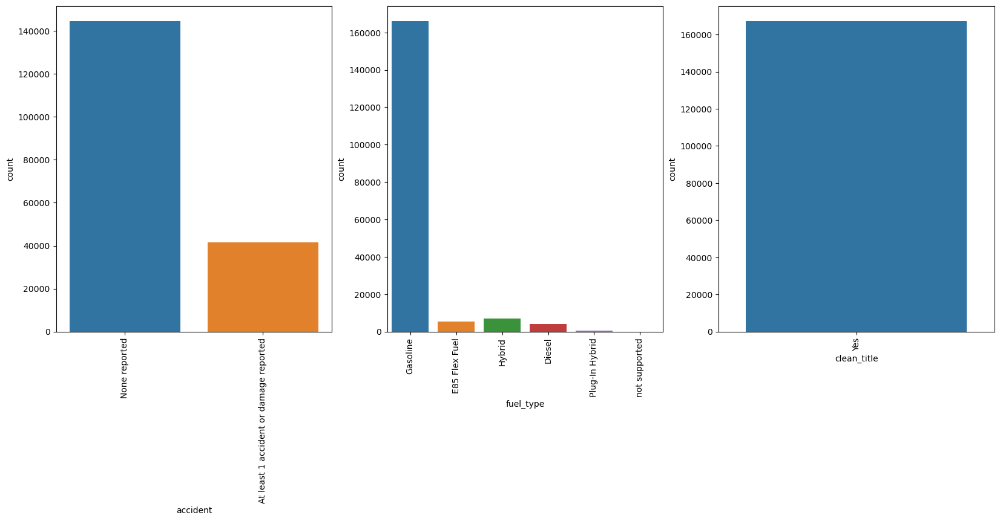

In [240]:
plt.figure(figsize = [20, 7])
plt.subplot(1, 3, 1)
sns.countplot(data = train_df, x = 'accident')
plt.xticks(rotation = 90)
plt.subplot(1, 3, 2)
sns.countplot(data = train_df, x = 'fuel_type')
plt.xticks(rotation = 90)
plt.subplot(1, 3, 3)
sns.countplot(data = train_df, x = 'clean_title')
plt.xticks(rotation = 90)
plt.show()

In [241]:
print("-"*20)
print(round(train_df['accident'].value_counts(normalize=True),2) * 100)
print("-"*20)
print(round(train_df['fuel_type'].value_counts(normalize=True),2) * 100)
print("-"*20)
print(round(train_df['clean_title'].value_counts(normalize=True),2) * 100)

--------------------
accident
None reported                             78.0
At least 1 accident or damage reported    22.0
Name: proportion, dtype: float64
--------------------
fuel_type
Gasoline          91.0
Hybrid             4.0
E85 Flex Fuel      3.0
Diesel             2.0
Plug-In Hybrid     0.0
not supported      0.0
Name: proportion, dtype: float64
--------------------
clean_title
Yes    100.0
Name: proportion, dtype: float64


    clean_title as it has only one value YES so this column isn't useful at all so for 
    now filling with `YES` to clean the data 

In [242]:
train_df['clean_title'] = train_df['clean_title'].replace(np.nan, 'Yes')
test_df['clean_title'] = test_df['clean_title'].replace(np.nan, 'Yes')

    For fuel_type there is 90% of data which has been covered so there must be that cars have null values and
    for accident there is low NULL points so can be replaced by NOne reported

In [243]:
train_df['accident'] = train_df['accident'].replace(np.nan, 'None reported')
train_df['fuel_type'] = train_df['fuel_type'].replace(np.nan, 'Gasoline')
test_df['accident'] = test_df['accident'].replace(np.nan, 'None reported')
test_df['fuel_type'] = test_df['fuel_type'].replace(np.nan, 'Gasoline')

In [244]:
print("-"*20)
print(round(train_df['int_col'].value_counts(normalize=True),2) * 100)
print("-"*20)
print(round(train_df['engine'].value_counts(normalize=True),2) * 100)
print("-"*20)
print(round(train_df['ext_col'].value_counts(normalize=True),2) * 100)
print("-"*20)
print(round(train_df['transmission'].value_counts(normalize=True),2) * 100)

--------------------
int_col
Black           59.0
Beige           13.0
Gray            12.0
Brown            3.0
Red              3.0
                ... 
Nougat Brown     0.0
Classic Red      0.0
Cobalt Blue      0.0
WHITE            0.0
ORANGE           0.0
Name: proportion, Length: 155, dtype: float64
--------------------
engine
355.0HP 5.3L 8 Cylinder Engine Gasoline Fuel           2.0
240.0HP 2.0L 4 Cylinder Engine Gasoline Fuel           2.0
420.0HP 6.2L 8 Cylinder Engine Gasoline Fuel           2.0
2.0L I4 16V GDI DOHC Turbo                             1.0
375.0HP 3.5L V6 Cylinder Engine Gasoline Fuel          1.0
                                                      ... 
151.0HP 1.5L 4 Cylinder Engine Gas/Electric Hybrid     0.0
184.0HP 2.4L 4 Cylinder Engine Flex Fuel Capability    0.0
78.0HP 1.2L 3 Cylinder Engine Gasoline Fuel            0.0
139.0HP 1.6L 4 Cylinder Engine Plug-In Electric/Gas    0.0
313.0HP 2.0L 4 Cylinder Engine Plug-In Electric/Gas    0.0
Name: proportion,

In [245]:
train_df['int_col'] = train_df['int_col'].replace(np.nan, 'Black')
train_df['engine'] = train_df['engine'].replace(np.nan, '355.0HP 5.3L 8 Cylinder Engine Gasoline Fuel')
train_df['ext_col'] = train_df['ext_col'].replace(np.nan, 'Black')
train_df['transmission'] = train_df['transmission'].replace(np.nan, 'A/T')

test_df['int_col'] = test_df['int_col'].replace(np.nan, 'Black')
test_df['engine'] = test_df['engine'].replace(np.nan, '355.0HP 5.3L 8 Cylinder Engine Gasoline Fuel')
test_df['ext_col'] = test_df['ext_col'].replace(np.nan, 'Black')
test_df['transmission'] = test_df['transmission'].replace(np.nan, 'A/T')

In [246]:
null_counter(train_df)

,column name,total count,percentage


In [247]:
null_counter(test_df)

,column name,total count,percentage


    Now our dataset is been cleaned so we can go with further process like Cleaning, Handling wrong values, imbalanced data 
    and more to make the dataset clean.

In [248]:
def upper_converter(data) :
    for col in data.columns:
        if data[col].dtype == object:
            data[col] = data[col].str.upper()

upper_converter(train_df)
upper_converter(test_df)

In [249]:
train_df.head()

,id,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price
0,0,MINI,COOPER S BASE,2007,213000,GASOLINE,172.0HP 1.6L 4 CYLINDER ENGINE GASOLINE FUEL,A/T,YELLOW,GRAY,NONE REPORTED,YES,4200
1,1,LINCOLN,LS V8,2002,143250,GASOLINE,252.0HP 3.9L 8 CYLINDER ENGINE GASOLINE FUEL,A/T,SILVER,BEIGE,AT LEAST 1 ACCIDENT OR DAMAGE REPORTED,YES,4999
2,2,CHEVROLET,SILVERADO 2500 LT,2002,136731,E85 FLEX FUEL,320.0HP 5.3L 8 CYLINDER ENGINE FLEX FUEL CAPAB...,A/T,BLUE,GRAY,NONE REPORTED,YES,13900
3,3,GENESIS,G90 5.0 ULTIMATE,2017,19500,GASOLINE,420.0HP 5.0L 8 CYLINDER ENGINE GASOLINE FUEL,TRANSMISSION W/DUAL SHIFT MODE,BLACK,BLACK,NONE REPORTED,YES,45000
4,4,MERCEDES-BENZ,METRIS BASE,2021,7388,GASOLINE,208.0HP 2.0L 4 CYLINDER ENGINE GASOLINE FUEL,7-SPEED A/T,BLACK,BEIGE,NONE REPORTED,YES,97500


In [250]:
train_df.duplicated().sum()

0

In [251]:
test_df.duplicated().sum()

0

    Now the duplicates aren't there.

In [252]:
train_df['id'] # As this columns|feature isn't useful for our Visualization and model purpose so am dropping it 
# In simple words this feature is useless for us!

train_df.drop('id', inplace = True, axis = 1)
test_df.drop('id', inplace = True, axis = 1)

In [253]:
train_df.columns

Index(['brand', 'model', 'model_year', 'milage', 'fuel_type', 'engine',
       'transmission', 'ext_col', 'int_col', 'accident', 'clean_title',
       'price'],
      dtype='object')

In [254]:
def value_counter(col) :
    print(f"As there are some {train_df[col].value_counts().count()} car {col} in our Dataset!")
    print("_"*30)
    
    coun = train_df[col].value_counts()
    perc = round(train_df[col].value_counts(normalize=True),2) * 100
    df_brand = pd.DataFrame({
        'total count' : coun,
        'percentage' : perc
    })

    return df_brand

In [255]:
value_counter('brand')

As there are some 57 car brand in our Dataset!
______________________________


,total count,percentage
brand,,
FORD,23088,12.0
MERCEDES-BENZ,19172,10.0
BMW,17028,9.0
CHEVROLET,16335,9.0
AUDI,10887,6.0
PORSCHE,10612,6.0
LAND,9525,5.0
TOYOTA,8850,5.0
LEXUS,8643,5.0


    As there are some 57 car brands in our Dataset!
    And have largest collection of 23088 something Ford as 12% ,
                                   19172 Mercedes-Benz as 10%,
                                   17028 BMW as 9% and more cars

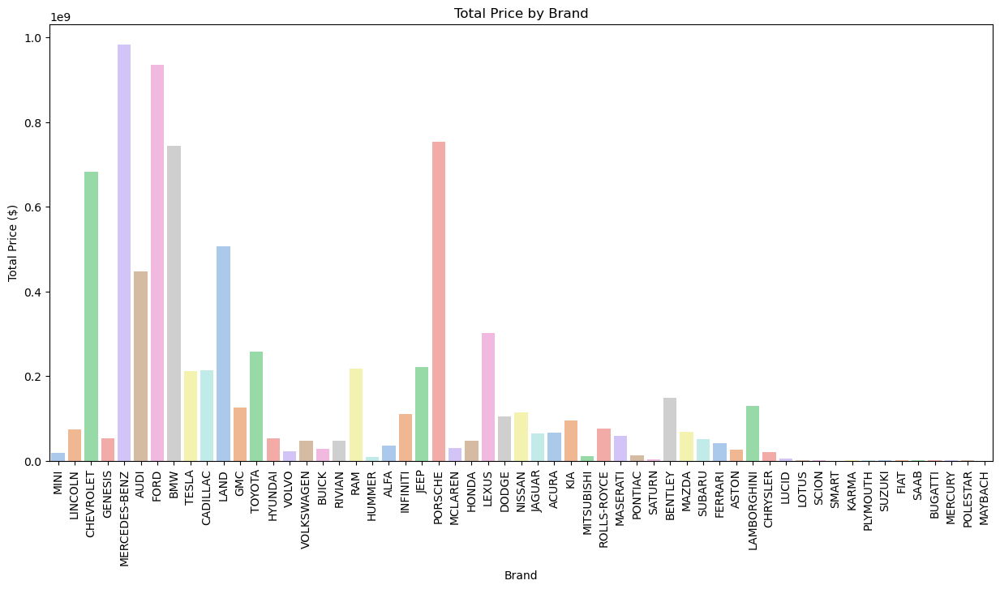

In [256]:
plt.figure(figsize = [15, 7])
sns.barplot(x = train_df['brand'], y = train_df['price'], palette='pastel', estimator = sum, errorbar = None)
plt.title('Total Price by Brand')
plt.ylabel('Total Price ($)')
plt.xlabel('Brand')
plt.xticks(rotation = 90)
plt.show()

In [257]:
value_counter('model')

As there are some 1893 car model in our Dataset!
______________________________


,total count,percentage
model,,
F-150 XLT,2945,2.0
M3 BASE,2229,1.0
CAMARO 2SS,1709,1.0
M4 BASE,1622,1.0
MUSTANG GT PREMIUM,1526,1.0
...,...,...
IONIQ PLUG-IN HYBRID SEL,2,0.0
X5 3.0I,1,0.0
XLR BASE,1,0.0


    The numbers of car model is too much as each car also have unique identifier to get their
    symbol branding.

In [258]:
value_counter('model_year')

As there are some 34 car model_year in our Dataset!
______________________________


,total count,percentage
model_year,,
2021,18198,10.0
2018,16414,9.0
2020,15848,8.0
2022,15749,8.0
2019,15409,8.0
2016,13696,7.0
2017,12794,7.0
2015,11389,6.0
2023,8769,5.0


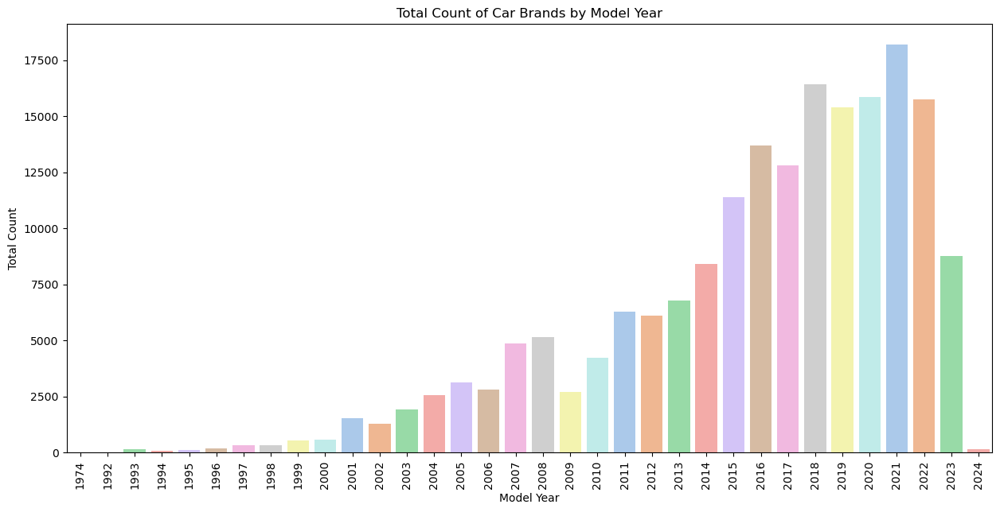

In [259]:
count_df = train_df.groupby('model_year').size().reset_index(name='count')

plt.figure(figsize = [15, 7])
sns.barplot(data=count_df, x='model_year', y='count', palette='pastel')
plt.title('Total Count of Car Brands by Model Year')
plt.xlabel('Model Year')
plt.ylabel('Total Count')
plt.xticks(rotation = 90)
plt.show()

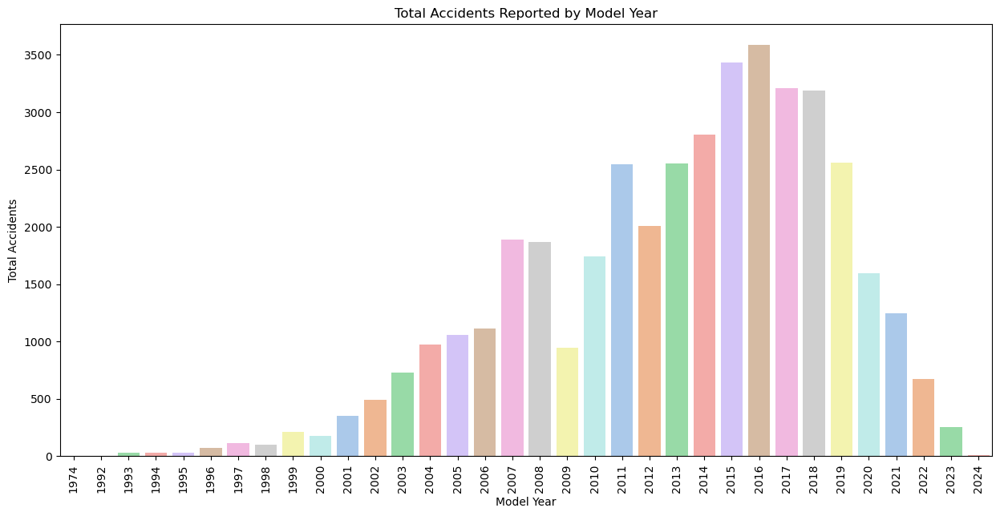

In [260]:
train_df['accident_count'] = train_df['accident'].apply(lambda x: 1 if "ACCIDENT" in x else 0)
count_df = train_df.groupby('model_year')['accident_count'].sum().reset_index()

plt.figure(figsize = [15, 7])
sns.barplot(data=count_df, x='model_year', y='accident_count', palette='pastel')
plt.title('Total Accidents Reported by Model Year')
plt.xlabel('Model Year')
plt.ylabel('Total Accidents')
plt.xticks(rotation = 90)
plt.show()

    As the car model year is also most important and hereby we see that mostly the cars are from 1992 to 2021
    with most cars in 2021.

In [261]:
value_counter('engine')

As there are some 1116 car engine in our Dataset!
______________________________


,total count,percentage
engine,,
355.0HP 5.3L 8 CYLINDER ENGINE GASOLINE FUEL,4387,2.0
240.0HP 2.0L 4 CYLINDER ENGINE GASOLINE FUEL,2902,2.0
420.0HP 6.2L 8 CYLINDER ENGINE GASOLINE FUEL,2841,2.0
2.0L I4 16V GDI DOHC TURBO,2680,1.0
375.0HP 3.5L V6 CYLINDER ENGINE GASOLINE FUEL,2451,1.0
...,...,...
151.0HP 1.5L 4 CYLINDER ENGINE GAS/ELECTRIC HYBRID,1,0.0
184.0HP 2.4L 4 CYLINDER ENGINE FLEX FUEL CAPABILITY,1,0.0
78.0HP 1.2L 3 CYLINDER ENGINE GASOLINE FUEL,1,0.0


    In engine we have somthing 1117 engines used as per company certified and maybe they can be used for further
    purpose so lets check what we can do with it.

In [262]:
def extract_engine_specs(engine_str):

    hp = re.search(r'(\d+\.?\d*)HP', engine_str)
    litre = re.search(r'(\d+\.\d*)\s*L(?:ITER)?\s*(TURBO)?|(\d+\.\d*)\s*L', engine_str)
    cylinder = re.search(r'(\d+ CYLINDER|\bV\d+\b|\bI\d+\b)', engine_str)

    hp_value = float(hp.group(1)) if hp else None
    litre_value = float(litre.group(1)) if litre else None
    cylinder_value = cylinder.group(1) if cylinder else None
    
    
    return pd.Series([hp_value, litre_value, cylinder_value], index=['Horse power', 'Litre', 'Cylinder'])

In [263]:
train_df[['Horse power', 'Litre', 'Cylinder']] = train_df['engine'].apply(extract_engine_specs)

In [264]:
def extract_cylinders(cylinder_str):
    if not isinstance(cylinder_str, str):
        return None
    matches = re.findall(r'\d+', cylinder_str)
    return int(matches[0]) if matches else None
train_df['Cylinder'] = train_df['Cylinder'].apply(extract_cylinders)

In [265]:
test_df[['Horse power', 'Litre', 'Cylinder']] = test_df['engine'].apply(extract_engine_specs)

In [266]:
def extract_cylinders(cylinder_str):
    if not isinstance(cylinder_str, str):
        return None
    matches = re.findall(r'\d+', cylinder_str)
    return int(matches[0]) if matches else None
test_df['Cylinder'] = test_df['Cylinder'].apply(extract_cylinders)

##### Its a part of cylinder

In [267]:
count = train_df.isnull().sum()
percen = count / len(train_df) * 100

count.sort_values(ascending = False)
percen.sort_values(ascending = False)

df_null = pd.DataFrame({
    'column name' : train_df.columns,
    'total count' : count,
    'percentage' : percen
})

df_null.reset_index(drop = True, inplace = True)
df_null_sorted = df_null.sort_values(by='percentage', ascending=False)
df_filtered = df_null_sorted[df_null_sorted['percentage'] > 0]
df_filtered

,column name,total count,percentage
13,Horse power,32334,17.150313
15,Cylinder,14261,7.564193
14,Litre,5773,3.062063


In [268]:
count = test_df.isnull().sum()
percen = count / len(test_df) * 100

count.sort_values(ascending = False)
percen.sort_values(ascending = False)

df_null = pd.DataFrame({
    'column name' : test_df.columns,
    'total count' : count,
    'percentage' : percen
})

df_null.reset_index(drop = True, inplace = True)
df_null_sorted = df_null.sort_values(by='percentage', ascending=False)
df_filtered = df_null_sorted[df_null_sorted['percentage'] > 0]
df_filtered

,column name,total count,percentage
11,Horse power,21564,17.156496
13,Cylinder,9438,7.508951
12,Litre,3763,2.993874


In [269]:
# train_df[train_df['Cylinder'].isnull()]

##### Its a part of Horse Power

In [270]:
train_df[train_df['Horse power'].isnull()].head(60)

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,accident_count,Horse power,Litre,Cylinder
8,FORD,F-150 XLT,2020,38352,GASOLINE,2.7L V6 24V PDI DOHC TWIN TURBO,10-SPEED AUTOMATIC,SNOWFLAKE WHITE PEARL METALLIC,BLACK,NONE REPORTED,YES,62890,0,NaN,2.7,6.0
11,TESLA,MODEL S P100D,2015,81500,GASOLINE,ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,1-SPEED A/T,GRAY,WHITE,NONE REPORTED,YES,19000,0,NaN,NaN,NaN
20,LAND,ROVER DEFENDER S,2023,7978,GASOLINE,5.2L V10 40V PDI DOHC,8-SPEED AUTOMATIC,SANTORINI BLACK METALLIC,BLACK,NONE REPORTED,YES,41998,0,NaN,5.2,10.0
39,BUICK,ENCLAVE PREMIUM,2022,9642,GASOLINE,3.6L V6 24V GDI DOHC,9-SPEED AUTOMATIC,EBONY TWILIGHT METALLIC,DARK GALVANIZED,NONE REPORTED,YES,63900,0,NaN,3.6,6.0
43,MERCEDES-BENZ,AMG GT 53 BASE,2022,10972,GASOLINE,4.0L V8 32V GDI DOHC TWIN TURBO,8-SPEED AUTOMATIC,MAGNETITE BLACK METALLIC,BLACK,NONE REPORTED,YES,244896,0,NaN,4.0,8.0
45,RAM,1500 LARAMIE,2022,27352,GASOLINE,5.7L V8 16V MPFI OHV,8-SPEED AUTOMATIC,DIAMOND BLACK,BLACK,NONE REPORTED,YES,42599,0,NaN,5.7,8.0
51,TESLA,MODEL 3 LONG RANGE,2020,38360,GASOLINE,DUAL MOTOR - STANDARD,AUTOMATIC,WHITE,BLACK,NONE REPORTED,YES,59598,0,NaN,NaN,NaN
60,MERCEDES-BENZ,GLS 450 BASE 4MATIC,2017,44147,GASOLINE,3.0L V6 24V GDI DOHC TWIN TURBO,9-SPEED AUTOMATIC,WHITE,PARCHMENT.,AT LEAST 1 ACCIDENT OR DAMAGE REPORTED,YES,29999,1,NaN,3.0,6.0
70,MCLAREN,570S SPIDER,2023,3254,GASOLINE,3.8L V8 32V MPFI DOHC TWIN TURBO,7-SPEED AUTOMATIC WITH AUTO-SHIFT,VEGA BLUE,BLACK,NONE REPORTED,YES,92500,0,NaN,3.8,8.0
72,TOYOTA,SEQUOIA PLATINUM,2023,2958,HYBRID,3.4L V6 24V PDI DOHC TWIN TURBO HYBRID,AUTOMATIC,GREEN,BOULDER,NONE REPORTED,YES,65998,0,NaN,3.4,6.0


##### For Litre

In [271]:
train_df[train_df['Litre'].isnull()]

,brand,model,model_year,milage,fuel_type,engine,transmission,ext_col,int_col,accident,clean_title,price,accident_count,Horse power,Litre,Cylinder
11,TESLA,MODEL S P100D,2015,81500,GASOLINE,ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,1-SPEED A/T,GRAY,WHITE,NONE REPORTED,YES,19000,0,NaN,NaN,NaN
32,TESLA,MODEL S P100D,2018,30300,GASOLINE,518.0HP ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,A/T,WHITE,WHITE,NONE REPORTED,YES,64000,0,518.0,NaN,NaN
44,RIVIAN,R1S ADVENTURE PACKAGE,2023,7000,GASOLINE,835.0HP ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,8-SPEED A/T,GREEN,BLACK,NONE REPORTED,YES,145000,0,835.0,NaN,NaN
51,TESLA,MODEL 3 LONG RANGE,2020,38360,GASOLINE,DUAL MOTOR - STANDARD,AUTOMATIC,WHITE,BLACK,NONE REPORTED,YES,59598,0,NaN,NaN,NaN
52,TESLA,MODEL X 75D,2021,88000,GASOLINE,518.0HP ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,1-SPEED A/T,BLACK,BLACK,NONE REPORTED,YES,53600,0,518.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188380,TESLA,MODEL S PERFORMANCE,2021,10500,GASOLINE,778.0HP ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,8-SPEED A/T,BLACK,BEIGE,NONE REPORTED,YES,98900,0,778.0,NaN,NaN
188455,FORD,MUSTANG MACH-E GT,2022,8000,GASOLINE,480.0HP ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,A/T,ORANGE,WHITE,NONE REPORTED,YES,115000,0,480.0,NaN,NaN
188462,FORD,MUSTANG MACH-E GT,2023,9000,GASOLINE,480.0HP ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,A/T,ORANGE,BLACK,NONE REPORTED,YES,85000,0,480.0,NaN,NaN
188484,FORD,MODEL X P100D,2018,52000,GASOLINE,534.0HP ELECTRIC MOTOR ELECTRIC FUEL SYSTEM,1-SPEED A/T,GRAY,BLACK,NONE REPORTED,YES,45000,0,534.0,NaN,NaN


In [272]:
train_df['Horse power'].mean()
train_df['Horse power'] = train_df['Horse power'].replace(np.nan, 343.333356807662)
train_df['Litre'].median()
train_df['Litre'] = train_df['Litre'].replace(np.nan, 3.5)
train_df['Cylinder'].median()
train_df['Cylinder'] = train_df['Cylinder'].replace(np.nan, 6.0)

In [273]:
test_df['Horse power'].mean()
test_df['Horse power'] = test_df['Horse power'].replace(np.nan, 343.333356807662)
test_df['Litre'].median()
test_df['Litre'] = test_df['Litre'].replace(np.nan, 3.5)
test_df['Cylinder'].median()
test_df['Cylinder'] = test_df['Cylinder'].replace(np.nan, 6.0)

In [274]:
train_df[['Horse power', 'Litre', 'Cylinder', 'price']]

,Horse power,Litre,Cylinder,price
0,172.000000,1.6,4.0,4200
1,252.000000,3.9,8.0,4999
2,320.000000,5.3,8.0,13900
3,420.000000,5.0,8.0,45000
4,208.000000,2.0,4.0,97500
...,...,...,...,...
188528,420.000000,6.2,8.0,27500
188529,385.000000,3.0,6.0,30000
188530,469.000000,4.0,8.0,86900
188531,343.333357,3.0,6.0,84900


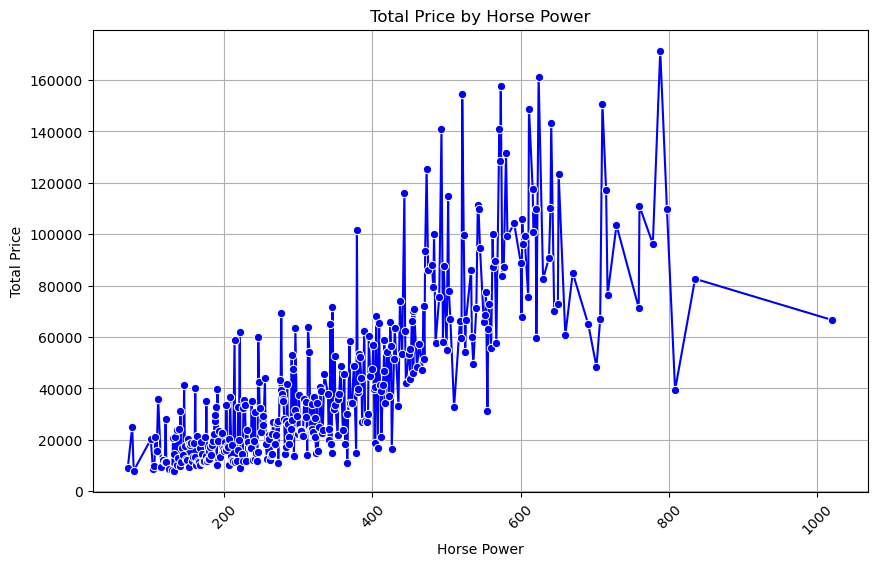

In [275]:
avg_price_hp = train_df.groupby('Horse power')['price'].mean().reset_index()

# Order by Horse power
avg_price_hp = avg_price_hp.sort_values(by='Horse power')

# Line plot for total price by Horse power
plt.figure(figsize=(10, 6))
sns.lineplot(data=avg_price_hp, x='Horse power', y='price', marker='o', color='blue')
plt.title('Total Price by Horse Power')
plt.xlabel('Horse Power')
plt.ylabel('Total Price')
plt.xticks(rotation=45)
plt.grid()
plt.show()

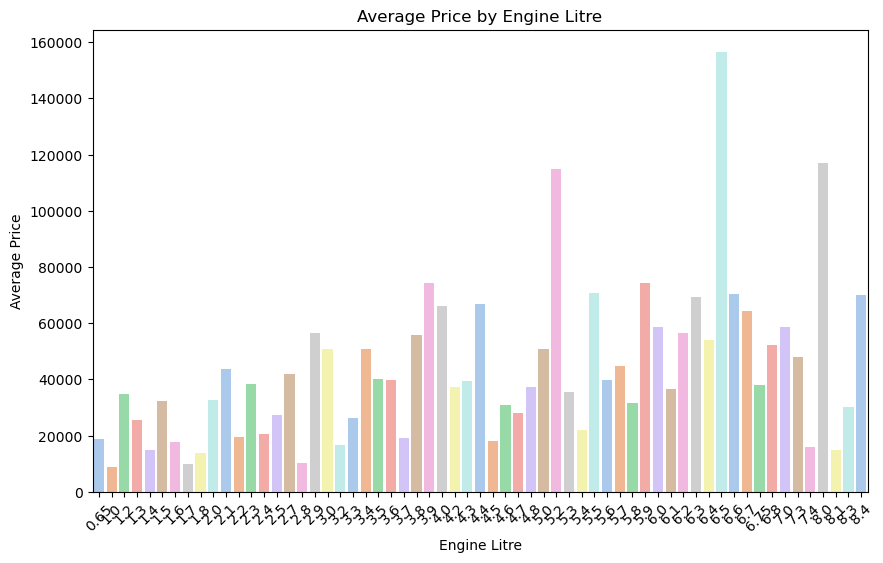

In [276]:
avg_price_litre = train_df.groupby('Litre')['price'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=avg_price_litre, x='Litre', y='price', palette='pastel')
plt.title('Average Price by Engine Litre')
plt.xlabel('Engine Litre')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()

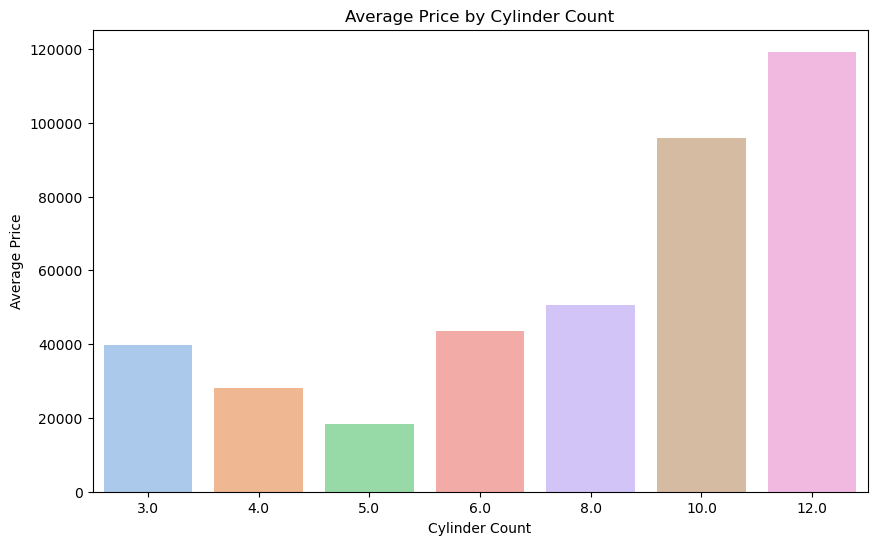

In [277]:
avg_price_cylinder = train_df.groupby('Cylinder')['price'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(data=avg_price_cylinder, x='Cylinder', y='price', palette='pastel')
plt.title('Average Price by Cylinder Count')
plt.xlabel('Cylinder Count')
plt.ylabel('Average Price')
plt.xticks(rotation=0)
plt.show()

In [278]:
value_counter('transmission')

As there are some 50 car transmission in our Dataset!
______________________________


,total count,percentage
transmission,,
A/T,49991,27.0
8-SPEED A/T,20652,11.0
TRANSMISSION W/DUAL SHIFT MODE,19255,10.0
6-SPEED A/T,18044,10.0
6-SPEED M/T,11998,6.0
7-SPEED A/T,11124,6.0
AUTOMATIC,10691,6.0
8-SPEED AUTOMATIC,8431,4.0
10-SPEED A/T,8044,4.0


    In car transmission there are around 52 values having 1/4 value of A/T and releted more.

In [279]:
train_df['transmission'].unique()

array(['A/T', 'TRANSMISSION W/DUAL SHIFT MODE', '7-SPEED A/T',
       '8-SPEED A/T', '10-SPEED AUTOMATIC', '1-SPEED A/T', '6-SPEED A/T',
       '10-SPEED A/T', '9-SPEED A/T', '8-SPEED AUTOMATIC',
       '9-SPEED AUTOMATIC', '5-SPEED A/T', 'AUTOMATIC',
       '7-SPEED AUTOMATIC WITH AUTO-SHIFT', 'CVT TRANSMISSION',
       '5-SPEED M/T', 'M/T', '6-SPEED M/T', '6-SPEED AUTOMATIC',
       '4-SPEED AUTOMATIC', '7-SPEED M/T', '2-SPEED A/T',
       '1-SPEED AUTOMATIC', 'AUTOMATIC CVT', '4-SPEED A/T',
       '6-SPEED MANUAL', 'TRANSMISSION OVERDRIVE SWITCH',
       '8-SPEED AUTOMATIC WITH AUTO-SHIFT', '7-SPEED MANUAL',
       '7-SPEED AUTOMATIC', '9-SPEED AUTOMATIC WITH AUTO-SHIFT',
       '6-SPEED AUTOMATIC WITH AUTO-SHIFT',
       '6-SPEED ELECTRONICALLY CONTROLLED AUTOMATIC WITH O', 'F', 'CVT-F',
       '8-SPEED MANUAL', 'MANUAL', '2', '6 SPEED AT/MT',
       '5-SPEED AUTOMATIC', '2-SPEED AUTOMATIC', '7-SPEED', 'VARIABLE',
       'SINGLE-SPEED FIXED GEAR', '8-SPEED AT',
       '10-SPEED AUT

In [280]:
def categorize_transmission(transmission):
    if 'AUTOMATIC' in transmission or 'CVT' in transmission or 'A/T' in transmission:
        return 'Automatic'
    elif 'M/T' in transmission or 'MANUAL' in transmission:
        return 'Manual'
    elif 'VARIABLE' in transmission:
        return 'Variable'
    elif 'SINGLE-SPEED' in transmission:
        return 'Single-Speed'
    else:
        return 'Other'

In [281]:
train_df['transmission'] = train_df['transmission'].apply(categorize_transmission)

In [282]:
train_df['transmission'].value_counts()

transmission
Automatic       152394
Other            19699
Manual           16358
Variable            66
Single-Speed        16
Name: count, dtype: int64

In [283]:
test_df['transmission'] = test_df['transmission'].apply(categorize_transmission)
test_df['transmission'].value_counts()

transmission
Automatic       101685
Other            13150
Manual           10785
Variable            58
Single-Speed        12
Name: count, dtype: int64

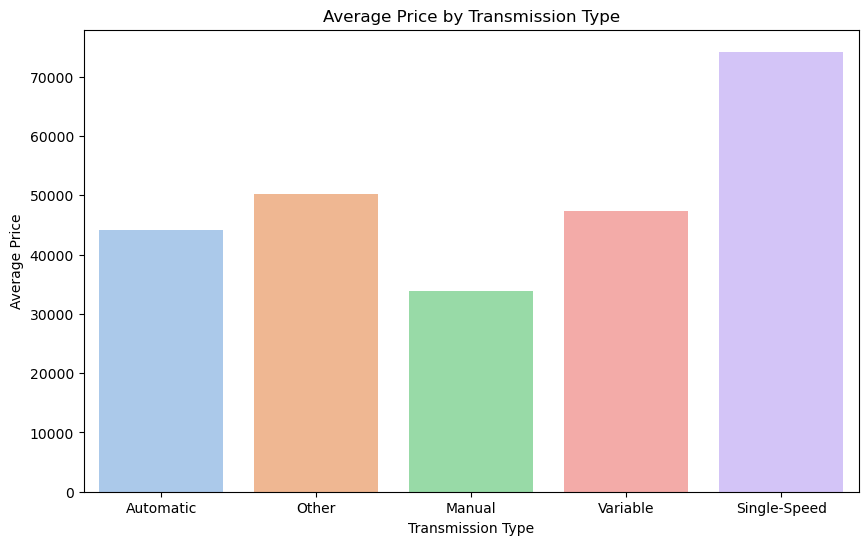

In [284]:
plt.figure(figsize=[10, 6])
sns.barplot(data=train_df, x='transmission', y='price', palette='pastel', errorbar = None)
plt.title('Average Price by Transmission Type')
plt.xlabel('Transmission Type')
plt.ylabel('Average Price')
plt.show()

In [285]:
train_df.columns

Index(['brand', 'model', 'model_year', 'milage', 'fuel_type', 'engine',
       'transmission', 'ext_col', 'int_col', 'accident', 'clean_title',
       'price', 'accident_count', 'Horse power', 'Litre', 'Cylinder'],
      dtype='object')

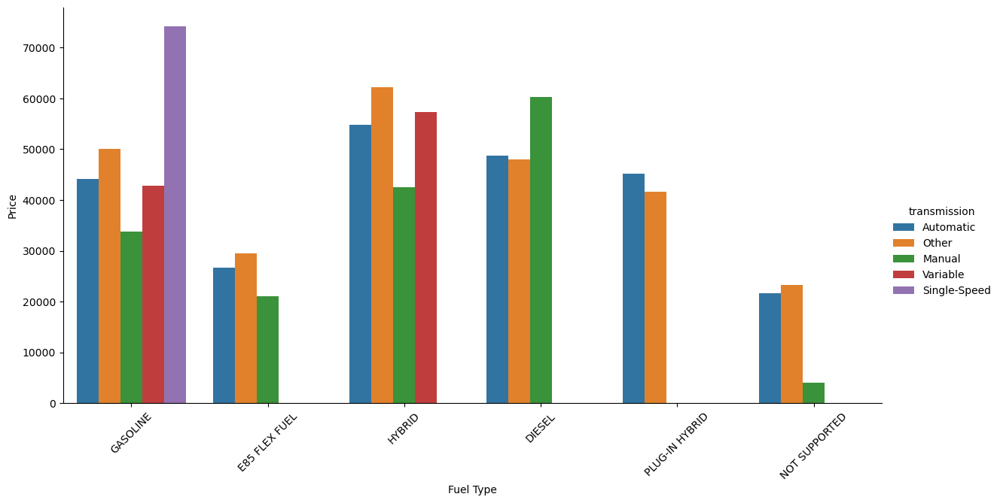

In [286]:
g = sns.catplot(data=train_df, x='fuel_type', y='price', hue='transmission', kind='bar', 
                height=6, aspect=2, errorbar = None)
g.set_titles('Price by Fuel Type and Transmission Type')
g.set_xticklabels(rotation=45)
g.set_axis_labels('Fuel Type', 'Price')
plt.show()

In [287]:
ext_list = value_counter('ext_col')
ext_list

As there are some 316 car ext_col in our Dataset!
______________________________


,total count,percentage
ext_col,,
BLACK,49053,26.0
WHITE,43815,23.0
GRAY,25293,13.0
SILVER,16995,9.0
BLUE,14558,8.0
...,...,...
FROZEN WHITE,6,0.0
BLUE CAELUM,5,0.0
GRANITE CRYSTAL METALLIC CLEARCOAT,5,0.0


In [288]:
unique_clr_ext = train_df['ext_col'].apply(lambda x: x if len(x.split()) == 1 else None).dropna().unique()
ext_colr = unique_clr_ext.tolist()

In [289]:
def map_color(color):

    color_parts = color.split()

    for part in color_parts:
        if part in ext_colr:
            return part
    return 'UNKNOWN'

In [290]:
train_df['exterior_colr'] = train_df['ext_col'].apply(map_color)

In [291]:
value_counter('exterior_colr')

As there are some 31 car exterior_colr in our Dataset!
______________________________


,total count,percentage
exterior_colr,,
BLACK,53812,29.0
WHITE,47801,25.0
GRAY,26775,14.0
SILVER,18716,10.0
BLUE,15751,8.0
RED,11770,6.0
GREEN,2948,2.0
METALLIC,1797,1.0
GOLD,1668,1.0


In [292]:
value_counts = train_df['exterior_colr'].value_counts()
total_count = len(train_df)
percentages = (value_counts / total_count) * 100

values_to_replace = percentages[percentages < 1].index

train_df['exterior_colr'] = train_df['exterior_colr'].replace(values_to_replace, 'MISC')

In [293]:
value_counter('exterior_colr')

As there are some 8 car exterior_colr in our Dataset!
______________________________


,total count,percentage
exterior_colr,,
BLACK,53812,29.0
WHITE,47801,25.0
GRAY,26775,14.0
SILVER,18716,10.0
BLUE,15751,8.0
RED,11770,6.0
MISC,10960,6.0
GREEN,2948,2.0


In [294]:
train_df['exterior_colr'] = train_df['exterior_colr'].map({'BLACK' : 1, 'WHITE' : 2, 'GRAY' : 3, 'SILVER' : 4,
                                               'BLUE' : 5, 'RED' : 6, 'MISC' : 7, 'GREEN' : 8})

In [295]:
value_counter('exterior_colr')

As there are some 8 car exterior_colr in our Dataset!
______________________________


,total count,percentage
exterior_colr,,
1,53812,29.0
2,47801,25.0
3,26775,14.0
4,18716,10.0
5,15751,8.0
6,11770,6.0
7,10960,6.0
8,2948,2.0


In [296]:
test_df['exterior_colr'] = test_df['ext_col'].apply(map_color)

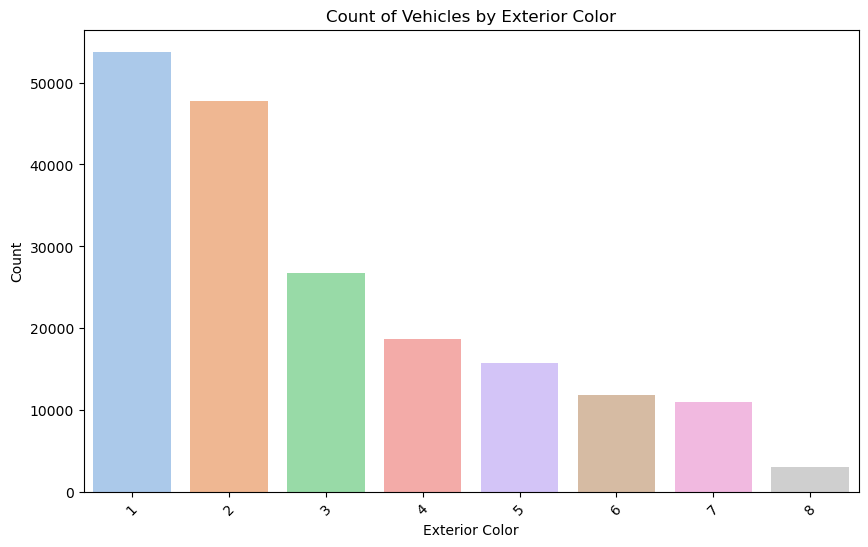

In [297]:
plt.figure(figsize = [10, 6])
sns.countplot(data=train_df, x='exterior_colr', palette='pastel')
plt.title('Count of Vehicles by Exterior Color')
plt.xlabel('Exterior Color')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [298]:
value_counts = test_df['exterior_colr'].value_counts()
total_count = len(test_df)
percentages = (value_counts / total_count) * 100

values_to_replace = percentages[percentages < 1].index

test_df['exterior_colr'] = test_df['exterior_colr'].replace(values_to_replace, 'MISC')

test_df['exterior_colr'] = test_df['exterior_colr'].map({'BLACK' : 1, 'WHITE' : 2, 'GRAY' : 3, 'SILVER' : 4,
                                               'BLUE' : 5, 'RED' : 6, 'MISC' : 7, 'GREEN' : 8})

In [299]:
test_df['exterior_colr'].value_counts()

exterior_colr
1    35759
2    31866
3    17930
4    12462
5    10516
6     7885
7     7231
8     2041
Name: count, dtype: int64

In [300]:
value_counter('int_col')

As there are some 151 car int_col in our Dataset!
______________________________


,total count,percentage
int_col,,
BLACK,112234,60.0
BEIGE,24503,13.0
GRAY,21204,11.0
BROWN,5810,3.0
RED,5145,3.0
...,...,...
CARBON BLACK,8,0.0
NOUGAT BROWN,7,0.0
BIANCO POLAR,7,0.0


In [301]:
unique_clr_int = train_df['int_col'].apply(lambda x: x if len(x.split()) == 1 else None).dropna().unique()
int_colr = unique_clr_int.tolist()

In [302]:
def map_color_02(color):

    color_parts = color.split()

    for part in color_parts:
        if part in int_colr:
            return part
    return 'UNKNOWN'

train_df['interior_colr'] = train_df['int_col'].apply(map_color_02)

In [303]:
value_counter('interior_colr')

As there are some 63 car interior_colr in our Dataset!
______________________________


,total count,percentage
interior_colr,,
BLACK,116322,62.0
BEIGE,24849,13.0
GRAY,21678,11.0
BROWN,6055,3.0
RED,5540,3.0
...,...,...
RED/BLACK,15,0.0
TUPELO,12,0.0
ORCHID,11,0.0


In [304]:
value_counts = train_df['interior_colr'].value_counts()
total_count = len(train_df)
percentages = (value_counts / total_count) * 100

values_to_replace = percentages[percentages < 0.5].index

train_df['interior_colr'] = train_df['interior_colr'].replace(values_to_replace, 'MISC')

In [305]:
value_counter('interior_colr')

As there are some 9 car interior_colr in our Dataset!
______________________________


,total count,percentage
interior_colr,,
BLACK,116322,62.0
BEIGE,24849,13.0
GRAY,21678,11.0
MISC,6231,3.0
BROWN,6055,3.0
RED,5540,3.0
WHITE,4873,3.0
EBONY,2016,1.0
ORANGE,969,1.0


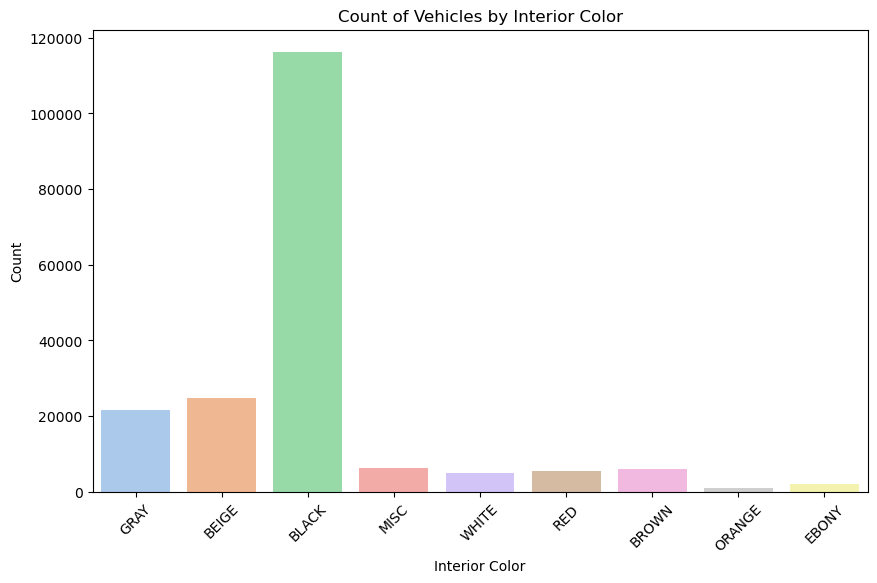

In [306]:
plt.figure(figsize = [10, 6])
sns.countplot(data=train_df, x='interior_colr', palette='pastel')
plt.title('Count of Vehicles by Interior Color')
plt.xlabel('Interior Color')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [307]:
train_df['interior_colr'] = train_df['interior_colr'].map({'BLACK' : 1, 'BEIGE' : 2, 'GRAY' : 3, 'MISC' : 4,
                                               'BROWN' : 5, 'RED' : 6, 'WHITE' : 7, 'EBONY' : 8, 'ORANGE' : 9})

In [308]:
value_counter('interior_colr')

As there are some 9 car interior_colr in our Dataset!
______________________________


,total count,percentage
interior_colr,,
1,116322,62.0
2,24849,13.0
3,21678,11.0
4,6231,3.0
5,6055,3.0
6,5540,3.0
7,4873,3.0
8,2016,1.0
9,969,1.0


In [309]:
test_df['interior_colr'] = test_df['int_col'].apply(map_color_02)

In [310]:
value_counts = test_df['interior_colr'].value_counts()
total_count = len(test_df)
percentages = (value_counts / total_count) * 100

values_to_replace = percentages[percentages < 1].index

test_df['interior_colr'] = test_df['interior_colr'].replace(values_to_replace, 'MISC')

test_df['interior_colr'] = test_df['interior_colr'].map({'BLACK' : 1, 'BEIGE' : 2, 'GRAY' : 3, 'MISC' : 4,
                                               'BROWN' : 5, 'RED' : 6, 'WHITE' : 7, 'EBONY' : 8, 'ORANGE' : 9})

In [311]:
test_df['interior_colr'].value_counts()

interior_colr
1    77306
2    16728
3    14542
4     4769
5     4070
6     3742
7     3220
8     1313
Name: count, dtype: int64

In [312]:
train_df.drop(['int_col', 'ext_col'], inplace = True, axis = 1)
test_df.drop(['int_col', 'ext_col'], inplace = True, axis = 1)

    The int_col and ext_col clarifies that the interior and exterior color of car that is specified.

In [313]:
value_counter('accident')

As there are some 2 car accident in our Dataset!
______________________________


,total count,percentage
accident,,
NONE REPORTED,146966,78.0
AT LEAST 1 ACCIDENT OR DAMAGE REPORTED,41567,22.0


    This accident seems that is the had an damage/accident or not. So we get that
    around 78% of cars aren't meet with the damage or accident and rest 20% + something
    are been in damaged.

In [314]:
train_df['accident'] = train_df['accident'].replace('NONE REPORTED', 0)
train_df['accident'] = train_df['accident'].replace('AT LEAST 1 ACCIDENT OR DAMAGE REPORTED',  1)

In [315]:
value_counter('accident')

As there are some 2 car accident in our Dataset!
______________________________


,total count,percentage
accident,,
0,146966,78.0
1,41567,22.0


In [316]:
test_df['accident'] = test_df['accident'].replace('NONE REPORTED', 0)
test_df['accident'] = test_df['accident'].replace('AT LEAST 1 ACCIDENT OR DAMAGE REPORTED',  1)

In [317]:
test_df['accident'].value_counts()

accident
0    97895
1    27795
Name: count, dtype: int64

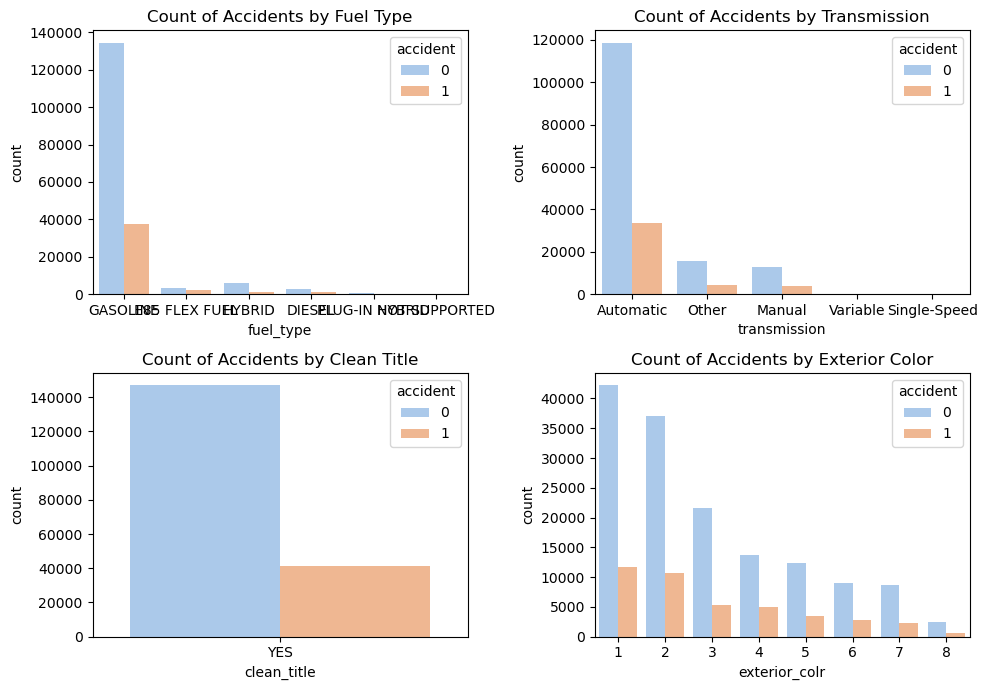

In [318]:
fig, axes = plt.subplots(2, 2, figsize=(10, 7))

sns.countplot(data=train_df, x='fuel_type', hue='accident', palette='pastel', ax=axes[0, 0])
axes[0, 0].set_title('Count of Accidents by Fuel Type')

sns.countplot(data=train_df, x='transmission', hue='accident', palette='pastel', ax=axes[0, 1])
axes[0, 1].set_title('Count of Accidents by Transmission')

sns.countplot(data=train_df, x='clean_title', hue='accident', palette='pastel', ax=axes[1, 0])
axes[1, 0].set_title('Count of Accidents by Clean Title')

sns.countplot(data=train_df, x='exterior_colr', hue='accident', palette='pastel', ax=axes[1, 1])
axes[1, 1].set_title('Count of Accidents by Exterior Color')

plt.tight_layout()
plt.show()

    As this can be treat as binary values if happened tell that 1 or not tell 0. 

In [319]:
value_counter('clean_title')

As there are some 1 car clean_title in our Dataset!
______________________________


,total count,percentage
clean_title,,
YES,188533,100.0


In [320]:
test_df['clean_title'].value_counts()

clean_title
YES    125690
Name: count, dtype: int64

    It maybe determines that is this car brand symbol is there or not and we fond that every car has been 
    their car symbol.
    So i am removing it.

In [321]:
expen = train_df.groupby('brand')['price'].mean().reset_index()
expen = expen.sort_values(by='price', ascending=False)
expen['brand_no'] = pd.factorize(expen['brand'])[0]
expen['brand_no']

train_df = train_df.merge(expen[['brand', 'brand_no']], on='brand', how='left')
test_df = test_df.merge(expen[['brand', 'brand_no']], on='brand', how='left')

In [322]:
train_df

,brand,model,model_year,milage,fuel_type,engine,transmission,accident,clean_title,price,accident_count,Horse power,Litre,Cylinder,exterior_colr,interior_colr,brand_no
0,MINI,COOPER S BASE,2007,213000,GASOLINE,172.0HP 1.6L 4 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,4200,0,172.000000,1.6,4.0,7,3,54
1,LINCOLN,LS V8,2002,143250,GASOLINE,252.0HP 3.9L 8 CYLINDER ENGINE GASOLINE FUEL,Automatic,1,YES,4999,1,252.000000,3.9,8.0,4,2,35
2,CHEVROLET,SILVERADO 2500 LT,2002,136731,E85 FLEX FUEL,320.0HP 5.3L 8 CYLINDER ENGINE FLEX FUEL CAPAB...,Automatic,0,YES,13900,0,320.000000,5.3,8.0,5,3,21
3,GENESIS,G90 5.0 ULTIMATE,2017,19500,GASOLINE,420.0HP 5.0L 8 CYLINDER ENGINE GASOLINE FUEL,Other,0,YES,45000,0,420.000000,5.0,8.0,1,1,13
4,MERCEDES-BENZ,METRIS BASE,2021,7388,GASOLINE,208.0HP 2.0L 4 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,97500,0,208.000000,2.0,4.0,1,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188528,CADILLAC,ESCALADE ESV PLATINUM,2017,49000,GASOLINE,420.0HP 6.2L 8 CYLINDER ENGINE GASOLINE FUEL,Other,0,YES,27500,0,420.000000,6.2,8.0,2,2,19
188529,MERCEDES-BENZ,AMG C 43 AMG C 43 4MATIC,2018,28600,GASOLINE,385.0HP 3.0L V6 CYLINDER ENGINE GASOLINE FUEL,Automatic,1,YES,30000,1,385.000000,3.0,6.0,2,1,17
188530,MERCEDES-BENZ,AMG GLC 63 BASE 4MATIC,2021,13650,GASOLINE,469.0HP 4.0L 8 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,86900,0,469.000000,4.0,8.0,2,1,17
188531,AUDI,S5 3.0T PRESTIGE,2022,13895,GASOLINE,3.0L,Automatic,0,YES,84900,0,343.333357,3.0,6.0,3,1,23


In [323]:
test_df

,brand,model,model_year,milage,fuel_type,engine,transmission,accident,clean_title,Horse power,Litre,Cylinder,exterior_colr,interior_colr,brand_no
0,LAND,ROVER LR2 BASE,2015,98000,GASOLINE,240.0HP 2.0L 4 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,240.000000,2.0,4.0,2,2,14
1,LAND,ROVER DEFENDER SE,2020,9142,HYBRID,395.0HP 3.0L STRAIGHT 6 CYLINDER ENGINE GASOLI...,Automatic,0,YES,395.000000,3.0,6.0,4,1,14
2,FORD,EXPEDITION LIMITED,2022,28121,GASOLINE,3.5L V6 24V PDI DOHC TWIN TURBO,Automatic,0,YES,343.333357,3.5,6.0,2,8,24
3,AUDI,A6 2.0T SPORT,2016,61258,GASOLINE,2.0 LITER TFSI,Automatic,0,YES,343.333357,2.0,6.0,7,1,23
4,AUDI,A6 2.0T PREMIUM PLUS,2018,59000,GASOLINE,252.0HP 2.0L 4 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,252.000000,2.0,4.0,3,1,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125685,MERCEDES-BENZ,GL-CLASS GL 450 4MATIC,2014,83315,GASOLINE,362.0HP 3.0L V6 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,362.000000,3.0,6.0,1,1,17
125686,AUDI,Q7 55 PRESTIGE,2019,29336,GASOLINE,3.0 LITER TURBO,Automatic,0,YES,343.333357,3.0,6.0,2,1,23
125687,AUDI,A6 3.0T PREMIUM PLUS,2012,77634,GASOLINE,333.0HP 3.0L V6 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,333.000000,3.0,6.0,1,1,23
125688,AUDI,Q7 3.0T PREMIUM,2012,112000,GASOLINE,333.0HP 3.0L V6 CYLINDER ENGINE GASOLINE FUEL,Automatic,0,YES,333.000000,3.0,6.0,1,1,23


In [324]:
train_df.drop(['model', 'engine', 'clean_title', 'brand'], inplace = True, axis = 1)
test_df.drop(['model', 'engine', 'clean_title', 'brand'], inplace = True, axis = 1)

In [325]:
train_df.head()

,model_year,milage,fuel_type,transmission,accident,price,accident_count,Horse power,Litre,Cylinder,exterior_colr,interior_colr,brand_no
0,2007,213000,GASOLINE,Automatic,0,4200,0,172.0,1.6,4.0,7,3,54
1,2002,143250,GASOLINE,Automatic,1,4999,1,252.0,3.9,8.0,4,2,35
2,2002,136731,E85 FLEX FUEL,Automatic,0,13900,0,320.0,5.3,8.0,5,3,21
3,2017,19500,GASOLINE,Other,0,45000,0,420.0,5.0,8.0,1,1,13
4,2021,7388,GASOLINE,Automatic,0,97500,0,208.0,2.0,4.0,1,2,17


In [326]:
test_df.head()

,model_year,milage,fuel_type,transmission,accident,Horse power,Litre,Cylinder,exterior_colr,interior_colr,brand_no
0,2015,98000,GASOLINE,Automatic,0,240.000000,2.0,4.0,2,2,14
1,2020,9142,HYBRID,Automatic,0,395.000000,3.0,6.0,4,1,14
2,2022,28121,GASOLINE,Automatic,0,343.333357,3.5,6.0,2,8,24
3,2016,61258,GASOLINE,Automatic,0,343.333357,2.0,6.0,7,1,23
4,2018,59000,GASOLINE,Automatic,0,252.000000,2.0,4.0,3,1,23


In [327]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188533 entries, 0 to 188532
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   model_year      188533 non-null  int64  
 1   milage          188533 non-null  int64  
 2   fuel_type       188533 non-null  object 
 3   transmission    188533 non-null  object 
 4   accident        188533 non-null  int64  
 5   price           188533 non-null  int64  
 6   accident_count  188533 non-null  int64  
 7   Horse power     188533 non-null  float64
 8   Litre           188533 non-null  float64
 9   Cylinder        188533 non-null  float64
 10  exterior_colr   188533 non-null  int64  
 11  interior_colr   188533 non-null  int64  
 12  brand_no        188533 non-null  int64  
dtypes: float64(3), int64(8), object(2)
memory usage: 18.7+ MB


In [328]:
df_dumm = pd.get_dummies(train_df[['fuel_type', 'transmission']], dtype = int, drop_first = True)
df_dumm

,fuel_type_E85 FLEX FUEL,fuel_type_GASOLINE,fuel_type_HYBRID,fuel_type_NOT SUPPORTED,fuel_type_PLUG-IN HYBRID,transmission_Manual,transmission_Other,transmission_Single-Speed,transmission_Variable
0,0,1,0,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,1,0,0
4,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
188528,0,1,0,0,0,0,1,0,0
188529,0,1,0,0,0,0,0,0,0
188530,0,1,0,0,0,0,0,0,0
188531,0,1,0,0,0,0,0,0,0


In [329]:
train_df.drop(['fuel_type', 'transmission'], inplace = True, axis = 1)
train_df

,model_year,milage,accident,price,accident_count,Horse power,Litre,Cylinder,exterior_colr,interior_colr,brand_no
0,2007,213000,0,4200,0,172.000000,1.6,4.0,7,3,54
1,2002,143250,1,4999,1,252.000000,3.9,8.0,4,2,35
2,2002,136731,0,13900,0,320.000000,5.3,8.0,5,3,21
3,2017,19500,0,45000,0,420.000000,5.0,8.0,1,1,13
4,2021,7388,0,97500,0,208.000000,2.0,4.0,1,2,17
...,...,...,...,...,...,...,...,...,...,...,...
188528,2017,49000,0,27500,0,420.000000,6.2,8.0,2,2,19
188529,2018,28600,1,30000,1,385.000000,3.0,6.0,2,1,17
188530,2021,13650,0,86900,0,469.000000,4.0,8.0,2,1,17
188531,2022,13895,0,84900,0,343.333357,3.0,6.0,3,1,23


In [330]:
train_df = pd.concat([df_dumm, train_df], axis = 1)
train_df.head()

,fuel_type_E85 FLEX FUEL,fuel_type_GASOLINE,fuel_type_HYBRID,fuel_type_NOT SUPPORTED,fuel_type_PLUG-IN HYBRID,transmission_Manual,transmission_Other,transmission_Single-Speed,transmission_Variable,model_year,milage,accident,price,accident_count,Horse power,Litre,Cylinder,exterior_colr,interior_colr,brand_no
0,0,1,0,0,0,0,0,0,0,2007,213000,0,4200,0,172.0,1.6,4.0,7,3,54
1,0,1,0,0,0,0,0,0,0,2002,143250,1,4999,1,252.0,3.9,8.0,4,2,35
2,1,0,0,0,0,0,0,0,0,2002,136731,0,13900,0,320.0,5.3,8.0,5,3,21
3,0,1,0,0,0,0,1,0,0,2017,19500,0,45000,0,420.0,5.0,8.0,1,1,13
4,0,1,0,0,0,0,0,0,0,2021,7388,0,97500,0,208.0,2.0,4.0,1,2,17


In [331]:
df_x = train_df.drop(columns = ['price'])
df_y = train_df['price']

In [332]:
df_x

,fuel_type_E85 FLEX FUEL,fuel_type_GASOLINE,fuel_type_HYBRID,fuel_type_NOT SUPPORTED,fuel_type_PLUG-IN HYBRID,transmission_Manual,transmission_Other,transmission_Single-Speed,transmission_Variable,model_year,milage,accident,accident_count,Horse power,Litre,Cylinder,exterior_colr,interior_colr,brand_no
0,0,1,0,0,0,0,0,0,0,2007,213000,0,0,172.000000,1.6,4.0,7,3,54
1,0,1,0,0,0,0,0,0,0,2002,143250,1,1,252.000000,3.9,8.0,4,2,35
2,1,0,0,0,0,0,0,0,0,2002,136731,0,0,320.000000,5.3,8.0,5,3,21
3,0,1,0,0,0,0,1,0,0,2017,19500,0,0,420.000000,5.0,8.0,1,1,13
4,0,1,0,0,0,0,0,0,0,2021,7388,0,0,208.000000,2.0,4.0,1,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188528,0,1,0,0,0,0,1,0,0,2017,49000,0,0,420.000000,6.2,8.0,2,2,19
188529,0,1,0,0,0,0,0,0,0,2018,28600,1,1,385.000000,3.0,6.0,2,1,17
188530,0,1,0,0,0,0,0,0,0,2021,13650,0,0,469.000000,4.0,8.0,2,1,17
188531,0,1,0,0,0,0,0,0,0,2022,13895,0,0,343.333357,3.0,6.0,3,1,23


In [333]:
scaler = MinMaxScaler()
x_scaled = pd.DataFrame(scaler.fit_transform(train_df), columns = train_df.columns)
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size = 0.2, random_state = 15)

#### Linear Regression

In [334]:
regression = LinearRegression()
regression

LinearRegression()

In [335]:
model = regression.fit(x_train, y_train)

In [336]:
y_train_pred = regression.predict(x_train)

In [337]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.105
Mean Squared Error (MSE) 	:5491844909.233
Root Mean Squared Error (RMSE)	:74106.983
Mean Absolute Error (MAE) 	:23228.383


In [338]:
y_test_pred = regression.predict(x_test)

In [339]:
mse = mean_squared_error(y_test, y_test_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.097
Mean Squared Error (MSE) 	:5881873249.787
Root Mean Squared Error (RMSE)	:76693.372
Mean Absolute Error (MAE) 	:23348.86


#### Decesion Tree

In [340]:
dec_model = DecisionTreeRegressor() 
dec_model

DecisionTreeRegressor()

In [341]:
decision = dec_model.fit(x_train, y_train)

In [342]:
y_train_pred = decision.predict(x_train)

In [343]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.976
Mean Squared Error (MSE) 	:147000530.285
Root Mean Squared Error (RMSE)	:12124.378
Mean Absolute Error (MAE) 	:627.682


In [344]:
y_test_pred = decision.predict(x_test)

In [345]:
mse = mean_squared_error(y_test, y_test_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:-1.067
Mean Squared Error (MSE) 	:13461552292.798
Root Mean Squared Error (RMSE)	:116023.93
Mean Absolute Error (MAE) 	:28781.377


In [346]:
dt_rgs = DecisionTreeRegressor()

hyp_grid = {
    'criterion' : ['absolute_error', 'poisson', 'squared_error', 'friedman_mse'],
    'max_depth' : np.arange(3, 15),
    'min_samples_split' : np.arange(2, 20),
    'min_samples_leaf' : np.arange(1, 20)
}

model_2 = GridSearchCV(dt_rgs, hyp_grid, cv = 5)

In [347]:
# model_2.fit(x_train, y_train)

In [348]:
# model_2.best_estimator_

#### Gradient Boost

In [349]:
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size=0.2, random_state=42)

In [350]:
gb_model = GradientBoostingRegressor(n_estimators = 100, learning_rate = 0.1, max_depth = 3, random_state = 42)
gb_model

GradientBoostingRegressor(random_state=42)

In [351]:
gb_model.fit(x_train, y_train)

GradientBoostingRegressor(random_state=42)

In [352]:
y_train_pred = gb_model.predict(x_train)

In [353]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.152
Mean Squared Error (MSE) 	:5403836714.189
Root Mean Squared Error (RMSE)	:73510.793
Mean Absolute Error (MAE) 	:19519.461


In [354]:
y_test_pred = gb_model.predict(x_test)

In [355]:
mse = mean_squared_error(y_test, y_test_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.162
Mean Squared Error (MSE) 	:4662205433.015
Root Mean Squared Error (RMSE)	:68280.344
Mean Absolute Error (MAE) 	:19663.836


#### Light Gradient Boost

In [356]:
!pip install lightgbm

In [357]:
import lightgbm as lgb

In [358]:
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size=0.2, random_state=42)

In [359]:
# Create LightGBM dataset
train_data = lgb.Dataset(x_train, label = y_train)
test_data = lgb.Dataset(x_test, label = y_test, reference = train_data)

In [360]:
params = {
    'objective': 'regression',
    'metric': 'rmse',
    'boosting_type': 'gbdt',
    'num_leaves': 31,
    'learning_rate': 0.05,
    'feature_fraction': 0.9
}

In [361]:
num_round = 100
bst = lgb.train(params, 
                train_data, 
                num_round, 
                valid_sets=[test_data], 
                valid_names=['test'])

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.019985 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 674
[LightGBM] [Info] Number of data points in the train set: 150826, number of used features: 17
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Start training from score 43890.785316


In [362]:
y_train_pred = bst.predict(x_train, num_iteration = bst.best_iteration)

In [363]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.191
Mean Squared Error (MSE) 	:5157184199.52
Root Mean Squared Error (RMSE)	:71813.538
Mean Absolute Error (MAE) 	:19214.572


In [364]:
y_test_pred = bst.predict(x_test, num_iteration = bst.best_iteration)

In [365]:
mse = mean_squared_error(y_test, y_test_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.168
Mean Squared Error (MSE) 	:4625779299.922
Root Mean Squared Error (RMSE)	:68013.082
Mean Absolute Error (MAE) 	:19529.185


####  Cat Boost

In [366]:
x_train, x_test, y_train, y_test = train_test_split(df_x, df_y, test_size=0.2, random_state=42)

In [367]:
cat_model = CatBoostRegressor(iterations = 100, learning_rate = 0.1, depth = 3, verbose = 0)
cat_model.fit(x_train, y_train)

In [368]:
y_train_pred = cat_model.predict(x_train)

In [369]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.141
Mean Squared Error (MSE) 	:5473619382.884
Root Mean Squared Error (RMSE)	:73983.913
Mean Absolute Error (MAE) 	:19820.929


In [370]:
y_test_pred = cat_model.predict(x_test)

In [371]:
mse = mean_squared_error(y_test, y_test_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.158
Mean Squared Error (MSE) 	:4679723646.15
Root Mean Squared Error (RMSE)	:68408.506
Mean Absolute Error (MAE) 	:19909.581


#### Ada Boost

In [372]:
ada_mod = AdaBoostRegressor()
ada_mod

AdaBoostRegressor()

In [373]:
ada_dec_reg = ada_mod.fit(x_train, y_train)

In [374]:
y_train_pred = ada_dec_reg.predict(x_train)

In [375]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:-1.648
Mean Squared Error (MSE) 	:16878882921.423
Root Mean Squared Error (RMSE)	:129918.755
Mean Absolute Error (MAE) 	:77578.056


In [376]:
y_test_pred = ada_dec_reg.predict(x_test)

In [377]:
mse = mean_squared_error(y_test, y_test_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:-2.028
Mean Squared Error (MSE) 	:16841602502.036
Root Mean Squared Error (RMSE)	:129775.2
Mean Absolute Error (MAE) 	:78817.997


In [378]:
ada_regressor = AdaBoostRegressor()

hyperparam_grid = {
    'base_estimator': [DecisionTreeRegressor(max_depth=1), DecisionTreeRegressor(max_depth=2)],
    'n_estimators': np.arange(50, 201, 50),
    'learning_rate': [0.01, 0.1, 1.0],
    'loss': ['linear', 'square', 'exponential']
}

grid_search = GridSearchCV(estimator=ada_regressor, param_grid=hyperparam_grid, cv=5, scoring='neg_mean_squared_error')

In [379]:
# grid_search.fit(x_train, y_train)

In [380]:
# print("Best parameters:", grid_search.best_params_)
# print("Best score:", grid_search.best_score_)

#### XG Boost

In [381]:
mod_boost = XGBRegressor()
mod_boost

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [382]:
boost = mod_boost.fit(x_train, y_train)

In [383]:
y_train_pred = boost.predict(x_train)

In [384]:
mse = mean_squared_error(y_train, y_train_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_train, y_train_pred)
r2 = r2_score(y_train, y_train_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.381
Mean Squared Error (MSE) 	:3944516270.902
Root Mean Squared Error (RMSE)	:62805.384
Mean Absolute Error (MAE) 	:18278.5


In [385]:
y_test_pred = boost.predict(x_test)

In [386]:
mse = mean_squared_error(y_test, y_test_pred)
rmse = math.sqrt(mse)
mae = mean_absolute_error(y_test, y_test_pred)
r2 = r2_score(y_test, y_test_pred)

print(f"R-squared \t\t\t:{round(r2, 3)}")
print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

R-squared 			:0.115
Mean Squared Error (MSE) 	:4922562967.745
Root Mean Squared Error (RMSE)	:70160.979
Mean Absolute Error (MAE) 	:20324.945


In [387]:
xgb_regressor = XGBRegressor(random_state=42)

hyperparam_grid = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_search = GridSearchCV(
    estimator = xgb_regressor, 
    param_grid = hyperparam_grid,
    cv = 5, 
    scoring = 'neg_mean_squared_error',
    verbose = 1, 
    n_jobs = -1
)


In [388]:
# grid_search.fit(x_train, y_train)

In [389]:
# grid_search.best_estimators_

#### Support Vector Machine

In [390]:
sr = SVR()
sr

SVR()

In [391]:
# support = sr.fit(x_train, y_train)

In [392]:
# y_train_pred = support.predict(x_train)

In [393]:
# mse = mean_squared_error(y_train, y_train_pred)
# rmse = math.sqrt(mse)
# mae = mean_absolute_error(y_train, y_train_pred)
# r2 = r2_score(y_train, y_train_pred)

# print(f"R-squared \t\t\t:{round(r2, 3)}")
# print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
# print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
# print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

In [394]:
# y_test_pred = support.predict(x_test)

In [395]:
# mse = mean_squared_error(y_test, y_test_pred)
# rmse = math.sqrt(mse)
# mae = mean_absolute_error(y_test, y_test_pred)
# r2 = r2_score(y_test, y_test_pred)

# print(f"R-squared \t\t\t:{round(r2, 3)}")
# print(f"Mean Squared Error (MSE) \t:{round(mse, 3)}")
# print(f"Root Mean Squared Error (RMSE)\t:{round(rmse, 3)}")
# print(f"Mean Absolute Error (MAE) \t:{round(mae, 3)}")

#### Artificial Neural Network!

In [204]:
x_train.shape, x_test.shape

((150826, 19), (37707, 19))

In [205]:
seq = keras.Sequential()
seq

<Sequential name=sequential, built=False>

In [206]:
seq.add(keras.layers.Dense(units=6, activation='relu', kernel_initializer='he_uniform', input_shape=(19,)))
seq.add(keras.layers.Dropout(rate=0.5))

# Second hidden layer
seq.add(keras.layers.Dense(units=6, activation='relu', kernel_initializer='he_uniform'))
seq.add(keras.layers.Dropout(rate=0.5))

# Output layer for regression
seq.add(keras.layers.Dense(units=1, activation='linear', kernel_initializer='glorot_uniform'))

# Compile the model for regression
seq.compile(optimizer='Adam', loss='mean_squared_error', metrics=['mae'])

# Summary of the model
seq.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 6)                   │             120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 6)                   │              42 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 169 (676.00 B)

 Trainable params: 169 (676.00 B)

 Non-trainable params: 0 (0.00 B)

In [207]:
model = seq.fit(x = x_train, y = y_train, epochs = 20, batch_size = 20, validation_split = 0.35)

Epoch 1/20
4902/4902 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step - loss: 11666531328.0000 - mae: 56963.4414 - val_loss: 6462923264.0000 - val_mae: 25753.6680
Epoch 2/20
4902/4902 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - loss: 6940077568.0000 - mae: 33387.1797 - val_loss: 6453863936.0000 - val_mae: 25355.0137
Epoch 3/20
4902/4902 ━━━━━━━━━━━━━━━━━━━━ 15s 3ms/step - loss: 7011671552.0000 - mae: 33465.1172 - val_loss: 6469079040.0000 - val_mae: 25793.9570
Epoch 4/20
4902/4902 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step - loss: 7377704448.0000 - mae: 33708.1680 - val_loss: 6568710144.0000 - val_mae: 26912.9492
Epoch 5/20
4902/4902 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step - loss: 7489486336.0000 - mae: 33595.5234 - val_loss: 6448325120.0000 - val_mae: 25912.7793
Epoch 6/20
4902/4902 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - loss: 7404766208.0000 - mae: 33461.9102 - val_loss: 6528853504.0000 - val_mae: 26966.2207
Epoch 7/20
4902/4902 ━━━━━━━━━━━━━━━━━━━━ 19s 4ms/step - loss: 6048303104.0000 - mae: 32774.4180 - val_loss: 64248750

In [208]:
loss, mae = seq.evaluate(x_test, y_test)
print(f'Test Loss: {loss}, Test MAE: {mae}')

1179/1179 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - loss: 5474938368.0000 - mae: 24886.0781
Test Loss: 5692358656.0, Test MAE: 25173.900390625


In [209]:
y_pred = seq.predict(x_test)
print(y_pred)

1179/1179 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step
[[28315.023 ]
 [21184.406 ]
 [ 8611.133 ]
 ...
 [15186.69  ]
 [ 2440.5862]
 [31565.268 ]]


In [210]:
test_acc = r2_score(y_test, y_pred)
test_acc

-0.023595783721063857